# SVM и его ядра
__Суммарное количество баллов: 9__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ML][MS][HW07] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

В этом задании нам предстоит решить задачу SVM при помощи `cvxopt` и применить ее к искуственным данным. Затем аналогичным способом нужно будет решить задачу ядерного SVM и исследовать его поведение для различных ядер и значений их параметров.

In [1]:
from typing import NoReturn, Callable
import random

import matplotlib.pyplot as plt
import numpy
from cvxopt import solvers, spmatrix, matrix
from sklearn.datasets import make_moons, make_blobs

solvers.options['show_progress'] = False

In [2]:
SEED = 7
numpy.random.seed(SEED)
random.seed(SEED)

In [3]:
def visualize(clf, X, y):
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    x_border = (x_max - x_min) / 20 + 1.0e-3
    x_h = (x_max - x_min + 2 * x_border) / 200
    y_border = (y_max - y_min) / 20 + 1.0e-3
    y_h = (y_max - y_min + 2 * y_border) / 200
    
    cm = plt.cm.Spectral

    xx, yy = numpy.meshgrid(numpy.arange(x_min - x_border, x_max + x_border, x_h), numpy.arange(y_min - y_border, y_max + y_border, y_h))
    mesh = numpy.c_[xx.ravel(), yy.ravel()]

    z_class = clf.predict(mesh).reshape(xx.shape)

    # Put the result into a color plot
    plt.figure(1, figsize=(8, 8))
    plt.pcolormesh(xx, yy, z_class, cmap=cm, alpha=0.3, shading='gouraud')

    # Plot hyperplane and margin
    z_dist = clf.decision_function(mesh).reshape(xx.shape)
    plt.contour(xx, yy, z_dist, [0.0], colors='black')
    plt.contour(xx, yy, z_dist, [-1.0, 1.0], colors='black', linestyles='dashed')

    # Plot also the training points
    y_pred = clf.predict(X)

    ind_support = []
    ind_correct = []
    ind_incorrect = []
    for i in range(len(y)):
        if i in clf.support:
            ind_support.append(i)
        elif y[i] == y_pred[i]:
            ind_correct.append(i)
        else:
            ind_incorrect.append(i)

    plt.scatter(X[ind_correct, 0], X[ind_correct, 1], c=y[ind_correct], cmap=cm, alpha=1., edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_incorrect, 0], X[ind_incorrect, 1], c=y[ind_incorrect], cmap=cm, alpha=1., marker='*',
               s=50, edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_support, 0], X[ind_support, 1], c=y[ind_support], cmap=cm, alpha=1., edgecolor='yellow', linewidths=1.,
               s=40)

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.tight_layout()

In [4]:
def generate_dataset(moons=False):
    if moons:
        X, y = make_moons(1000, noise=0.075, random_state=42)
        return X, 2 * y - 1
    X, y = make_blobs(1000, 2, centers=[[0, 0], [-4, 2], [3.5, -2.0], [3.5, 3.5]], random_state=42)
    y = 2 * (y % 2) - 1
    return X, y

X, y = generate_dataset(True)

### Задание 1 (2 балла)
Для начала реализуем обычный линейный SVM. 

#### Методы
`fit(X, y)` - обучает SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Поля
`support` - индексы опорных элементов

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

А наша задача формулируется так:

$\begin{cases}0.5 \cdot w^\text{T}w + C \cdot \sum \xi_i \rightarrow \min_{w, \xi} \\ \xi \geq 0 \\ y_i (w^\text{T}x_i + w_0) \geq 1 - \xi_i \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = (w, w_0, \xi) \\ P = 
\left[
    \begin{array}{c|c}
      I & 0\\
      \hline
      0 & 0
    \end{array}
\right] \\ 
q = \left[
    \begin{array}{c}
      0 \\
      \hline
      C 
    \end{array}
\right] \\ 
 G = 
\left[
    \begin{array}{c|c|c}
      0 & 0 & -I\\
      \hline
      -yX & -y & -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      0 \\
      \hline
      -1 
    \end{array}
\right] $

In [5]:
class LinearSVM:
    def __init__(self, C: float):
        """
        
        Parameters
        ----------
        C : float
            Soft margin coefficient.
        
        """
        self.C = C
        self.support = None
        self._weights = None
        self._bias = None

    def fit(self, X: numpy.ndarray, y: numpy.ndarray):
        """
        Обучает SVM, решая задачу оптимизации при помощи cvxopt.solvers.qp
        
        Parameters
        ----------
        X : numpy.ndarray
            Данные для обучения SVM.
        y : numpy.ndarray
            Бинарные метки классов для элементов X 
            (можно считать, что равны -1 или 1). 
        
        """
        n_samples, n_features = X.shape
        y = y.reshape(-1, 1)
        P = matrix(numpy.block([
            [numpy.eye(n_features), numpy.zeros((n_features, n_samples + 1))],
            [numpy.zeros((n_samples + 1, n_features + n_samples + 1))]
        ]))
        q = matrix(numpy.vstack([
            numpy.zeros((n_features + 1, 1)), numpy.ones((n_samples, 1)) * self.C
        ]))
        G = matrix(numpy.block([
            [numpy.zeros((n_samples, n_features + 1)), -numpy.eye(n_samples)],
            [-y * X, -y, -numpy.eye(n_samples)]
        ]))
        h = matrix(numpy.vstack([
            numpy.zeros((n_samples, 1)), -numpy.ones((n_samples, 1))
        ]))

        x = numpy.array(solvers.qp(P, q, G, h)['x'])
        self._weights = x[:n_features]
        self._bias = x[n_features]
        
        margin = (y * (X.dot(self._weights) + self._bias)).reshape(-1)
        self.support = numpy.where(margin <= 1)[0]

    def decision_function(self, X: numpy.ndarray) -> numpy.ndarray:
        """
        Возвращает значение решающей функции.
        
        Parameters
        ----------
        X : numpy.ndarray
            Данные, для которых нужно посчитать значение решающей функции.

        Return
        ------
        numpy.ndarray
            Значение решающей функции для каждого элемента X 
            (т.е. то число, от которого берем знак с целью узнать класс).     
        
        """
        return X.dot(self._weights) + self._bias

    def predict(self, X: numpy.ndarray) -> numpy.ndarray:
        """
        Классифицирует элементы X.
        
        Parameters
        ----------
        X : numpy.ndarray
            Данные, которые нужно классифицировать

        Return
        ------
        numpy.ndarray
            Метка класса для каждого элемента X.   
        
        """
        return numpy.sign(self.decision_function(X))

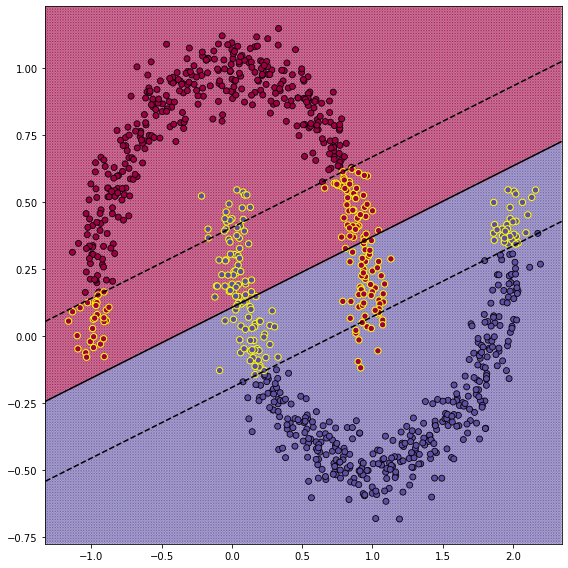

In [6]:
X, y = generate_dataset(True)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

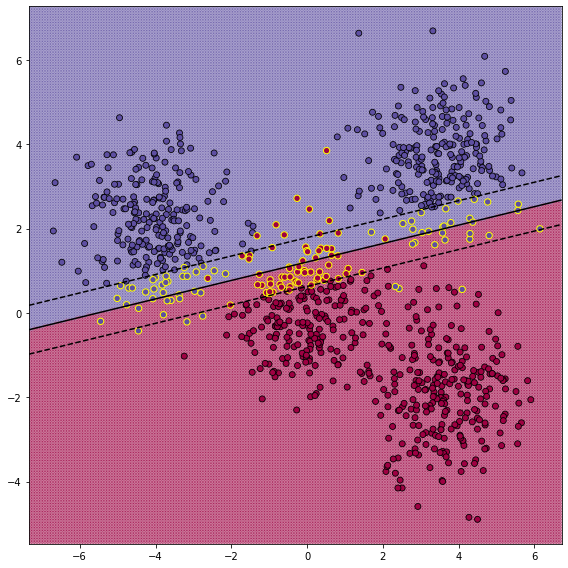

In [7]:
X, y = generate_dataset(False)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 2 (2 балла)
Перед реализацией ядерного SVM, реализуем функции, которые строят ядра.

#### Описание
`get_polynomial_kernel(power)` - возвращает полиномиальное ядро с заданной константой и степенью

`get_gaussian_kernel(sigma=1.)` - возвращает ядро Гаусса с заданным коэффицинтом сигма

In [8]:
def linear_kernel(x1: numpy.ndarray, x2: numpy.ndarray) -> numpy.ndarray:
    return x1.dot(x2.T)

def get_polynomial_kernel(c=1, power=2):
    "Возвращает полиномиальное ядро с заданной константой и степенью"
    def polynomial_kernel(x1: numpy.ndarray, x2: numpy.ndarray) -> numpy.ndarray:
        pairwise_scalar_dot = x1.dot(x2.T)
        return numpy.power(c + pairwise_scalar_dot, power)
    return polynomial_kernel

def get_gaussian_kernel(sigma=1.):
    "Возвращает ядро Гаусса с заданным коэффицинтом сигма"
    def gaussian_kernel(x1: numpy.ndarray, x2: numpy.ndarray) -> numpy.ndarray:
        pairwise_euclid_dist = numpy.power(x2 - x1[:, None], 2).sum(-1)
        return numpy.exp(-sigma * pairwise_euclid_dist)
    return gaussian_kernel

### Задание 3 (2 балла)
Теперь перейдем к реализации самого kernel SVM.

#### Описание
`fit(X, y)` - обучает kernel SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Конструктор
`kernel` - ядро-функция

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

Будем решать двойственную задачу. Формулируется она так:

$\begin{cases}\sum \alpha_i - 0.5 \sum \alpha_i \alpha_j y_i y_j K(x_i, x_j) \rightarrow \max_{\alpha}\\ C \geq \alpha \geq 0 \\ y_i \alpha = 0 \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = \alpha \\ P = 
\left[ y_i y_j K(y_i, y_j) \right] \\ 
q = \left[ -1
\right] \\ 
 G = 
\left[
    \begin{array}{c}
      I\\
      \hline
      -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      C \\
      \hline
      0 
    \end{array}
\right] \\
b = 0\\
A = y^\text{T}$

В таком случае решающей функцией будет:

$a(x) = \text{sign} (\sum \alpha_i y_i K(x, x_i) + w_0)$, где $w_0 = \frac{1}{n}\sum\limits_{i=1}^{n}[y_i - \sum \alpha_j y_j K(x_i, x_j)]$

In [9]:
class KernelSVM:
    
    _X = None
    _y = None
    w0 = None
    alphas = None
    
    def __init__(self, C: float, kernel: Callable = linear_kernel):
        """
        
        Parameters
        ----------
        C : float
            Soft margin coefficient.
        kernel : Callable
            Функция ядра.
        
        """
        self.C = C
        self.kernel = kernel
        self.support = None

    def fit(self, X: numpy.ndarray, y: numpy.ndarray):
        """
        Обучает SVM, решая задачу оптимизации при помощи cvxopt.solvers.qp
        
        Parameters
        ----------
        X : numpy.ndarray
            Данные для обучения SVM.
        y : numpy.ndarray
            Бинарные метки классов для элементов X 
            (можно считать, что равны -1 или 1). 
        
        """
        self._X = X
        self._y = y.reshape(-1, 1)
        n_samples, n_features = X.shape
        
        pairwise_kernel = self.kernel(X, X)
        P = matrix(self._y * self._y.T * pairwise_kernel)
        q = matrix(-numpy.ones((n_samples, 1)))
        G = matrix(numpy.vstack([numpy.eye(n_samples), -numpy.eye(n_samples)]))
        h = matrix(numpy.vstack([numpy.full((n_samples, 1), self.C), numpy.zeros((n_samples, 1))]))
        b = matrix(numpy.zeros((1, 1)))
        A = matrix(y.reshape(1, -1).astype(numpy.float))

        # [1; n samples]
        self._alphas = numpy.array(solvers.qp(P, q, G, h, A, b)['x']).reshape(1, -1)
        self._w0 = numpy.mean(
            y - 
            numpy.sum(
                pairwise_kernel * self._alphas * y.reshape(1, -1), axis=1, keepdims=True
            )
        )

        margin = numpy.sum(pairwise_kernel * self._alphas * self._y.reshape(1, -1), axis=1) + self._w0
        self.support = numpy.where(numpy.abs(margin) <= 1)[0]
        

    def decision_function(self, X: numpy.ndarray) -> numpy.ndarray:
        """
        Возвращает значение решающей функции.
        
        Parameters
        ----------
        X : numpy.ndarray
            Данные, для которых нужно посчитать значение решающей функции.

        Return
        ------
        numpy.ndarray
            Значение решающей функции для каждого элемента X 
            (т.е. то число, от которого берем знак с целью узнать класс).     
        
        """
        pairwise_kernel = self.kernel(X, self._X)
        return numpy.sum(pairwise_kernel * self._alphas * self._y.reshape(1, -1), axis=1) + self._w0
        

    def predict(self, X: numpy.ndarray) -> numpy.ndarray:
        """
        Классифицирует элементы X.
        
        Parameters
        ----------
        X : numpy.ndarray
            Данные, которые нужно классифицировать

        Return
        ------
        numpy.ndarray
            Метка класса для каждого элемента X.   
        
        """
        return numpy.sign(self.decision_function(X))

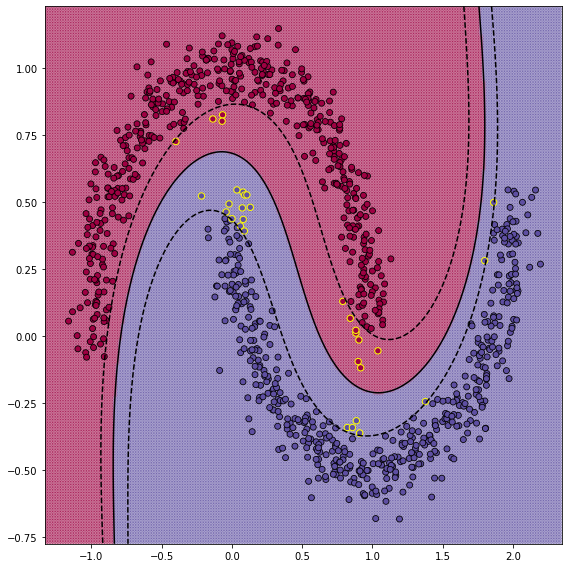

In [10]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

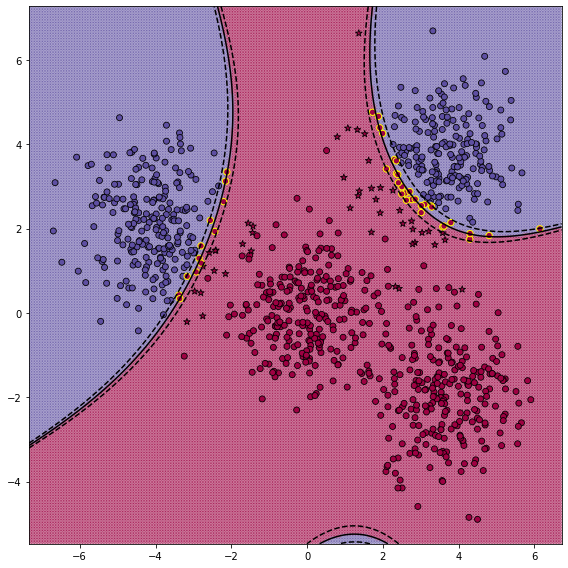

In [11]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

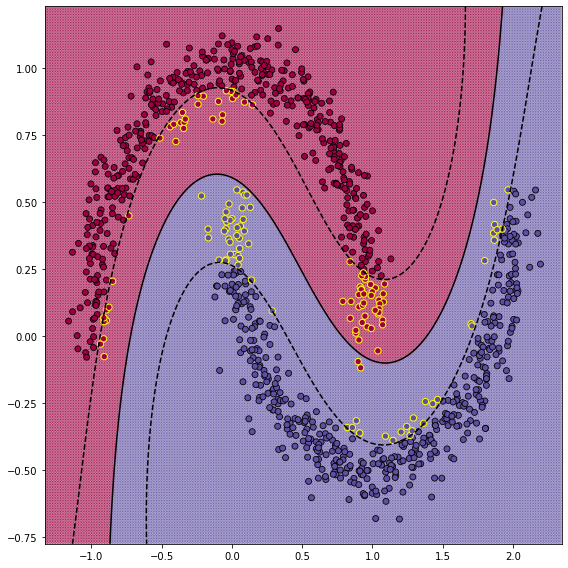

In [12]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

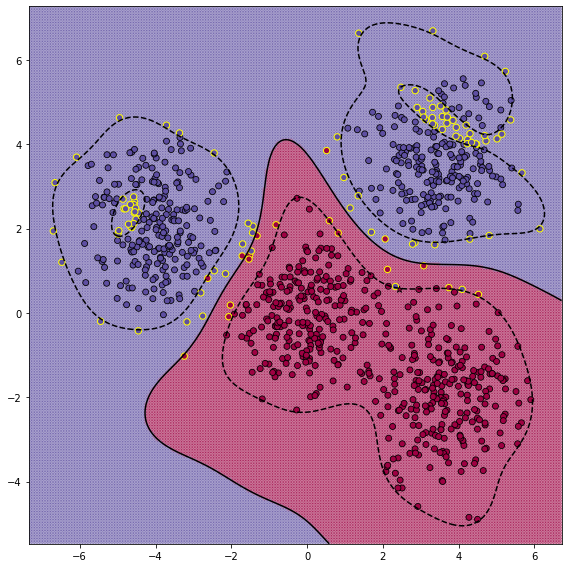

In [13]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 4 (3 балла)
Исследуйте и опишите влияние параметров каждого вида ядра на полученный классификатор. Что происходит при увеличении константы в полиномиальном ядре? При увеличении степени? Как влияет на результат сигма в ядре Гаусса?

__При выполнении этого задания стоит написать код, который визуализирует классификаторы с различными ядрами__

### Polynomial kernel

Влияние константы на построение гиперплоскости

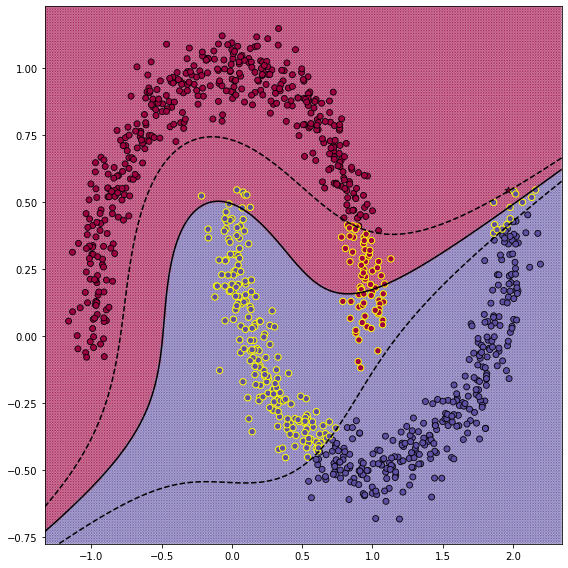

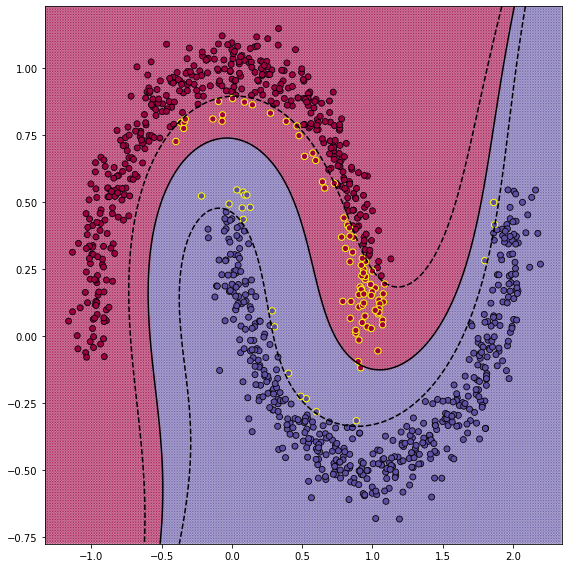

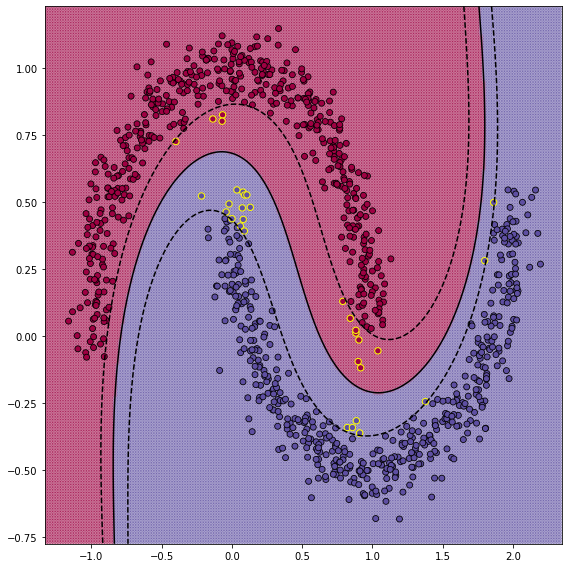

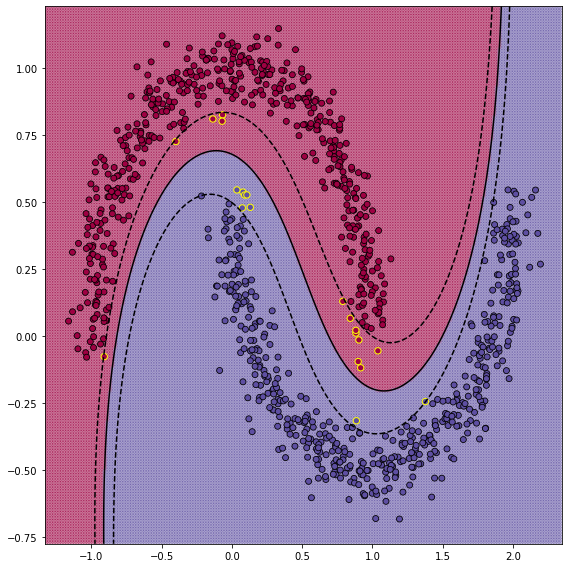

In [14]:
C = [0.01, 0.1, 1, 10]

X, y = generate_dataset(True)
for c in C:
    svm = KernelSVM(1, kernel=get_polynomial_kernel(c, 3))
    svm.fit(X, y)
    visualize(svm, X, y)
    plt.show()

Влияние степени на построение гиперплоскости

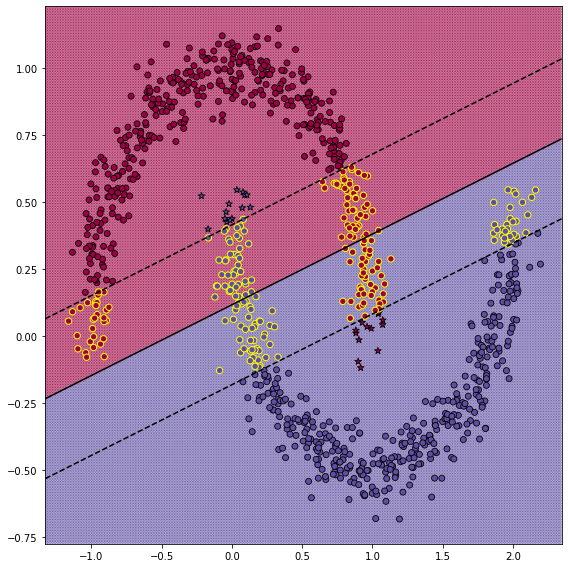

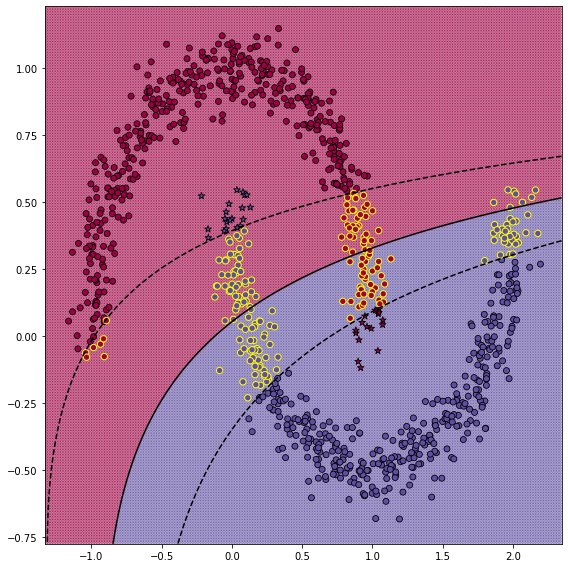

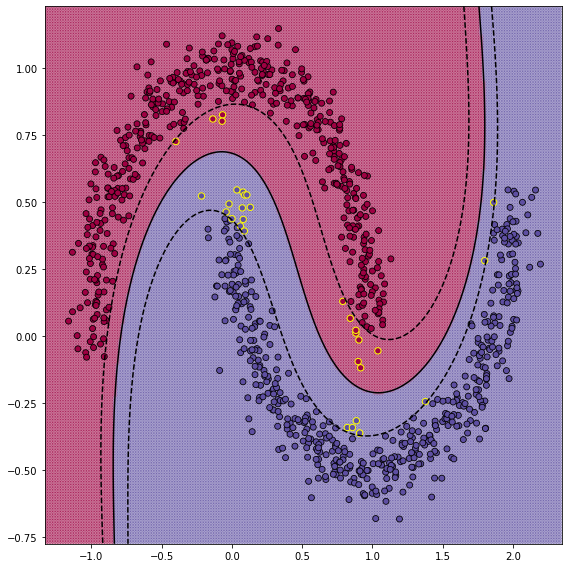

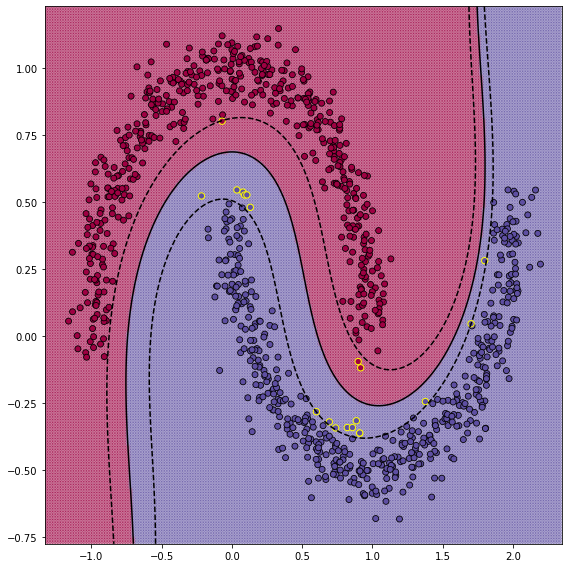

In [15]:
powers = [1, 2, 3, 4]

X, y = generate_dataset(True)
for p in powers:
    svm = KernelSVM(1, kernel=get_polynomial_kernel(1, p))
    svm.fit(X, y)
    visualize(svm, X, y)
    plt.show()

**Вывод**: в полиномиальном ядре, константа позволяет задавать ширину "полосы". Более высокие значения соответствуют более узкой "полоске". Степень же позволяет задать кривизну этой полоски, чем выше степень, тем более изощрённую форму принимает "полоса".

### RBF kernel

Влияние множителя на построение гиперплоскости

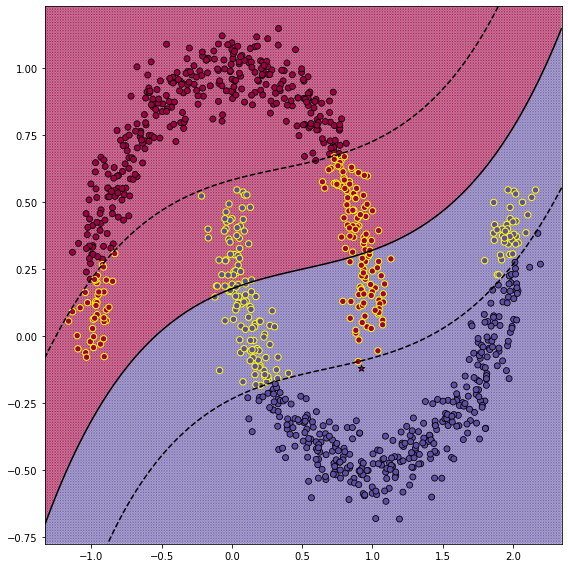

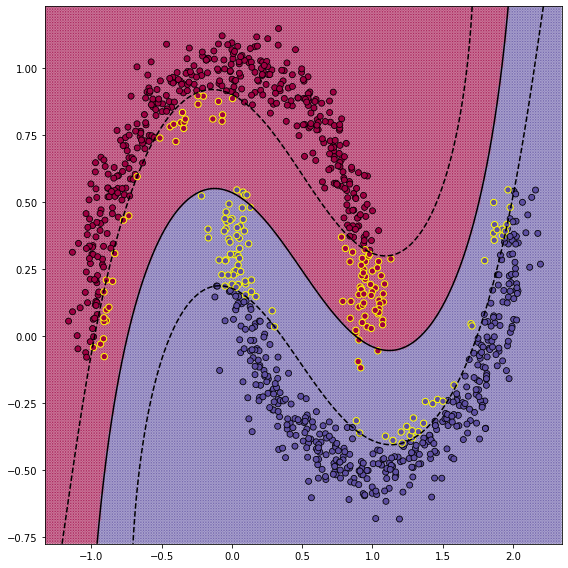

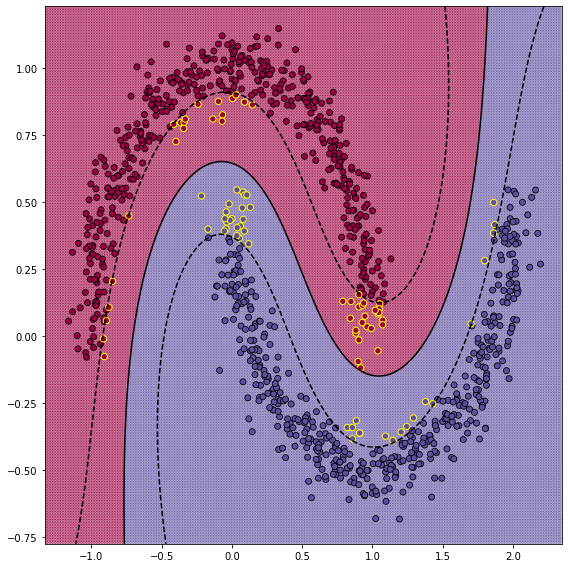

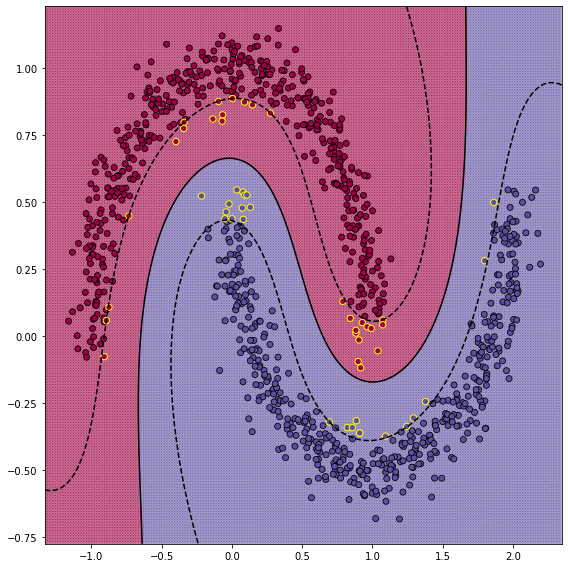

In [16]:
sigmas = [0.1, 0.3, 0.6, 1]
X, y = generate_dataset(True)
for sigma in sigmas:
    svm = KernelSVM(1, kernel=get_gaussian_kernel(sigma))
    svm.fit(X, y)
    visualize(svm, X, y)
    plt.show()

**Вывод**: увеличение параметра ядра Гаусса позволило сделать "полосу" более кривой и узкой. Однако чрезмерно большие значения обратно увеличивают ширину "полосы".